In [53]:

!pip install neuralprophet[live]



In [54]:
!pip install plotly


In [55]:
!pip install yfinance

In [56]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#from neuralprophet import NeuralProphet
import yfinance as yf
from datetime import datetime
import requests

In [57]:
# Define ticker symbols for the mutual funds
nippon = "0P00005WDS.BO"
hdfc = "0P0001NSWV.BO"
invesco = "0P0000XVHC.BO"
icici = "0P00005UO6.BO"
iti = "0P0001HCLR.BO"

# Download data
nippon_df = yf.download(nippon, start="2022-01-01", progress=False)
hdfc_df = yf.download(hdfc, start="2022-01-01", progress=False)
invesco_df = yf.download(invesco, start="2022-01-01", progress=False)
icici_df = yf.download(icici, start="2022-01-01", progress=False)
iti_df = yf.download(iti, start="2022-01-01", progress=False)

# Drop unwanted columns
columns_to_drop = ['High', 'Low', 'Open', 'Volume']

nippon_df = nippon_df.drop(columns=columns_to_drop)
hdfc_df = hdfc_df.drop(columns=columns_to_drop)
invesco_df = invesco_df.drop(columns=columns_to_drop)
icici_df = icici_df.drop(columns=columns_to_drop)
iti_df = iti_df.drop(columns=columns_to_drop)

In [58]:
print(nippon_dff.shape)


(798, 2)


In [59]:
invesco_df.head()

Price,Close
Ticker,0P0000XVHC.BO
Date,
2022-01-03,93.139999
2022-01-04,93.470001
2022-01-05,93.860001
2022-01-06,93.550003
2022-01-07,93.930000


In [60]:
nippon_df.reset_index(inplace=True)
hdfc_df.reset_index(inplace=True)
invesco_df.reset_index(inplace=True)
icici_df.reset_index(inplace=True)
iti_df.reset_index(inplace=True)


In [61]:
nippon_df.info()
hdfc_df.info()
invesco_df.info()
icici_df.info()
iti_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 798 entries, 0 to 797
Data columns (total 2 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   (Date, )                798 non-null    datetime64[ns]
 1   (Close, 0P00005WDS.BO)  798 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 12.6 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 798 entries, 0 to 797
Data columns (total 2 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   (Date, )                798 non-null    datetime64[ns]
 1   (Close, 0P0001NSWV.BO)  798 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 12.6 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 798 entries, 0 to 797
Data columns (total 2 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                 

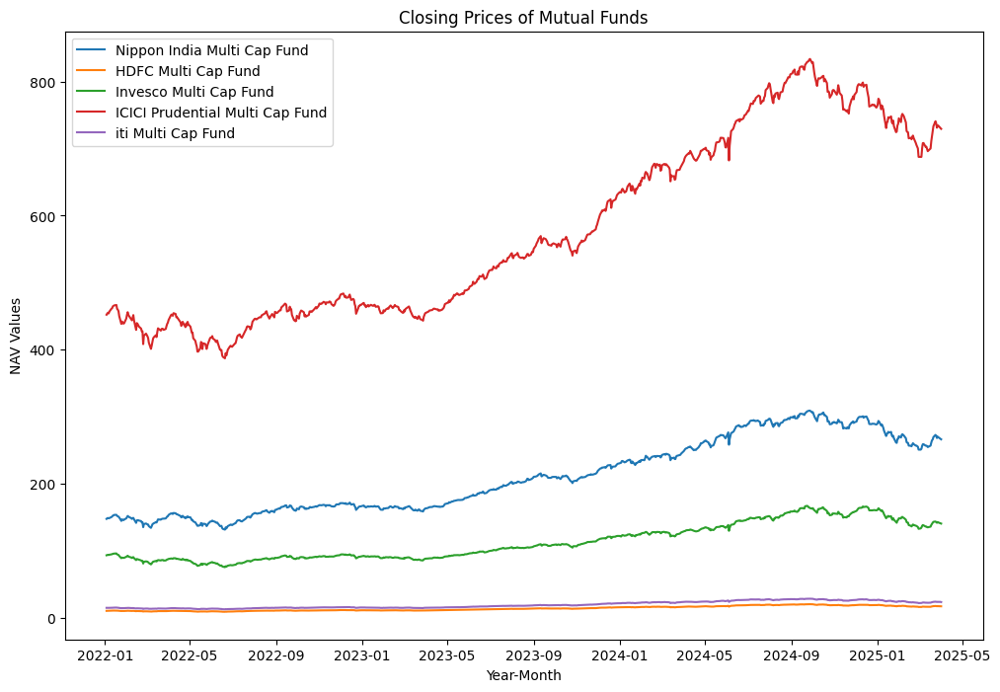

In [62]:
# Plot closing prices for all mutual funds
plt.figure(figsize=(12, 8))
plt.plot(nippon_df['Date'], nippon_df['Close'], label='Nippon India Multi Cap Fund')
plt.plot(hdfc_df['Date'], hdfc_df['Close'], label='HDFC Multi Cap Fund')
plt.plot(invesco_df['Date'], invesco_df['Close'], label='Invesco Multi Cap Fund')
plt.plot(icici_df['Date'], icici_df['Close'], label='ICICI Prudential Multi Cap Fund')
plt.plot(iti_df['Date'], iti_df['Close'], label='iti Multi Cap Fund')

plt.title('Closing Prices of Mutual Funds')
plt.xlabel('Year-Month')
plt.ylabel('NAV Values')
plt.legend()
plt.show()


In [63]:
hdfc_df.head()

Price,Date,Close
Ticker,,0P0001NSWV.BO
0,2022-01-03,10.209
1,2022-01-04,10.262
2,2022-01-05,10.300
3,2022-01-06,10.270
4,2022-01-07,10.331


In [64]:
# Prepare data for NeuralProphet model for all five mutual funds

# Nippon India Multi Cap Fund
nippon_dff = nippon_df[['Date', 'Close']].copy()
nippon_dff.columns = ['ds', 'y']
nippon_dff['ds'] = pd.to_datetime(nippon_dff['ds']).dt.tz_localize(None)

# HDFC Multi Cap Fund
hdfc_dff = hdfc_df[['Date', 'Close']].copy()
hdfc_dff.columns = ['ds', 'y']
hdfc_dff['ds'] = pd.to_datetime(hdfc_dff['ds']).dt.tz_localize(None)

# Invesco Multi Cap Fund
invesco_dff = invesco_df[['Date', 'Close']].copy()
invesco_dff.columns = ['ds', 'y']
invesco_dff['ds'] = pd.to_datetime(invesco_dff['ds']).dt.tz_localize(None)

# ICICI Prudential Multi Cap Fund
icici_dff = icici_df[['Date', 'Close']].copy()
icici_dff.columns = ['ds', 'y']
icici_dff['ds'] = pd.to_datetime(icici_dff['ds']).dt.tz_localize(None)

# ITI Multi Cap Fund
iti_dff = iti_df[['Date', 'Close']].copy()
iti_dff.columns = ['ds', 'y']
iti_dff['ds'] = pd.to_datetime(iti_dff['ds']).dt.tz_localize(None)

# Verify the processed dataframes
print("Nippon India Multi Cap Fund - NeuralProphet Ready Data:")
print(nippon_dff.head())
print("\nHDFC Multi Cap Fund - NeuralProphet Ready Data:")
print(hdfc_dff.head())
print("\nInvesco Multi Cap Fund - NeuralProphet Ready Data:")
print(invesco_dff.head())
print("\nICICI Prudential Multi Cap Fund - NeuralProphet Ready Data:")
print(icici_dff.head())
print("\nITI Multi Cap Fund - NeuralProphet Ready Data:")
print(iti_dff.head())


Nippon India Multi Cap Fund - NeuralProphet Ready Data:
          ds           y
0 2022-01-03  147.430695
1 2022-01-04  148.406693
2 2022-01-05  148.768997
3 2022-01-06  148.270004
4 2022-01-07  148.628494

HDFC Multi Cap Fund - NeuralProphet Ready Data:
          ds       y
0 2022-01-03  10.209
1 2022-01-04  10.262
2 2022-01-05  10.300
3 2022-01-06  10.270
4 2022-01-07  10.331

Invesco Multi Cap Fund - NeuralProphet Ready Data:
          ds          y
0 2022-01-03  93.139999
1 2022-01-04  93.470001
2 2022-01-05  93.860001
3 2022-01-06  93.550003
4 2022-01-07  93.930000

ICICI Prudential Multi Cap Fund - NeuralProphet Ready Data:
          ds           y
0 2022-01-03  452.070007
1 2022-01-04  453.790009
2 2022-01-05  455.070007
3 2022-01-06  454.059998
4 2022-01-07  456.709991

ITI Multi Cap Fund - NeuralProphet Ready Data:
          ds        y
0 2022-01-03  14.7024
1 2022-01-04  14.7425
2 2022-01-05  14.7419
3 2022-01-06  14.6929
4 2022-01-07  14.6925


In [65]:
print(nippon_dff.isnull().sum())
print(hdfc_dff.isnull().sum())
print(invesco_dff.isnull().sum())
print(icici_dff.isnull().sum())
print(iti_dff.isnull().sum())
#no null values

ds    0
y     0
dtype: int64
ds    0
y     0
dtype: int64
ds    0
y     0
dtype: int64
ds    0
y     0
dtype: int64
ds    0
y     0
dtype: int64


WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 93.86% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 93.86% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an al

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (32) is too small than the required number                     for the learning rate finder (227). The results might not be optimal.


Finding best initial lr:   0%|          | 0/227 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 93.86% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 93.86% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an al

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (32) is too small than the required number                     for the learning rate finder (227). The results might not be optimal.


Finding best initial lr:   0%|          | 0/227 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 93.86% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 93.86% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an al

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (32) is too small than the required number                     for the learning rate finder (227). The results might not be optimal.


Finding best initial lr:   0%|          | 0/227 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 93.86% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 93.86% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an al

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (32) is too small than the required number                     for the learning rate finder (227). The results might not be optimal.


Finding best initial lr:   0%|          | 0/227 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 93.393% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 93.393% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an 

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (32) is too small than the required number                     for the learning rate finder (227). The results might not be optimal.


Finding best initial lr:   0%|          | 0/227 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

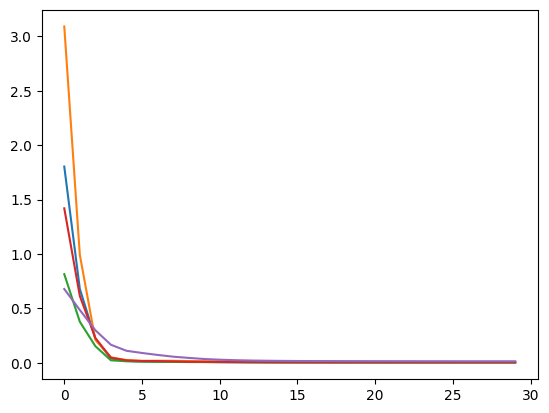

In [85]:
from neuralprophet import NeuralProphet

# Define a function to fit the NeuralProphet model and return both model and metrics
def fit_neuralprophet_model(fund_data):
    model = NeuralProphet(
        n_lags=90,
        n_forecasts=90,
        n_changepoints=10,
        daily_seasonality=True,
        seasonality_mode='multiplicative',
        epochs=30
    )
    # Capture the training metrics
    metrics = model.fit(fund_data, freq='D', progress="plot")
    return model, metrics  # Return both model and training metrics

# Fit models and store training metrics
neural_nippon, metrics_nippon = fit_neuralprophet_model(nippon_dff)
neural_hdfc, metrics_hdfc = fit_neuralprophet_model(hdfc_dff)
neural_invesco, metrics_invesco = fit_neuralprophet_model(invesco_dff)
neural_icici, metrics_icici = fit_neuralprophet_model(icici_dff)
neural_iti, metrics_iti = fit_neuralprophet_model(iti_dff)



            ds           y
793 2025-03-25  271.215210
794 2025-03-26  268.068787
795 2025-03-27  270.210205
796 2025-03-28  269.265991
797 2025-04-01  266.141998
ds    0
y     0
dtype: int64
            ds   y
883 2025-06-26 NaN
884 2025-06-27 NaN
885 2025-06-28 NaN
886 2025-06-29 NaN
887 2025-06-30 NaN


In [86]:
def generate_future_data(model, df):  ## Ensure future data is generated before predictions
    return model.make_future_dataframe(df=df, n_historic_predictions=False, periods=90)

In [87]:
future_nippon = neural_nippon.make_future_dataframe(df=nippon_dff, n_historic_predictions=True, periods=90)
future_hdfc = neural_hdfc.make_future_dataframe(df=hdfc_dff, n_historic_predictions=True, periods=90)
future_invesco = neural_invesco.make_future_dataframe(df=invesco_dff, n_historic_predictions=True, periods=90)
future_icici = neural_icici.make_future_dataframe(df=icici_dff, n_historic_predictions=True, periods=90)
future_iti = neural_iti.make_future_dataframe(df=iti_dff, n_historic_predictions=True, periods=90)

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 93.86% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 93.86% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprop

In [88]:
#  Debug: Check if future dates exist
print(future_nippon.tail(10))

            ds   y
878 2025-06-21 NaN
879 2025-06-22 NaN
880 2025-06-23 NaN
881 2025-06-24 NaN
882 2025-06-25 NaN
883 2025-06-26 NaN
884 2025-06-27 NaN
885 2025-06-28 NaN
886 2025-06-29 NaN
887 2025-06-30 NaN


In [89]:
# Make predictions
forecast_nippon = neural_nippon.predict(future_nippon)
forecast_hdfc = neural_hdfc.predict(future_hdfc)
forecast_invesco = neural_invesco.predict(future_invesco)
forecast_icici = neural_icici.predict(future_icici)
forecast_iti = neural_iti.predict(future_iti)


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 94.482% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 94.482% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralpr

Predicting: |          | 0/? [00:00<?, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fr

Predicting: |          | 0/? [00:00<?, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fr

Predicting: |          | 0/? [00:00<?, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fr

Predicting: |          | 0/? [00:00<?, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fr

Predicting: |          | 0/? [00:00<?, ?it/s]

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/data/process.py:127: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fr

In [72]:
# Ignore first 90 NaN values when evaluating predictions
def drop_na_forecasts(forecast):
    return forecast.dropna(subset=['yhat90'])

forecast_nippon = drop_na_forecasts(forecast_nippon)
forecast_hdfc = drop_na_forecasts(forecast_hdfc)
forecast_invesco = drop_na_forecasts(forecast_invesco)
forecast_icici = drop_na_forecasts(forecast_icici)
forecast_iti = drop_na_forecasts(forecast_iti)

In [73]:
neural_nippon.plot(forecast_nippon)


WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




In [74]:
neural_hdfc.plot(forecast_hdfc)



WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




In [75]:
neural_invesco.plot(forecast_invesco)


WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




In [76]:
neural_icici.plot(forecast_icici)


WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




In [77]:
neural_iti.plot(forecast_iti)

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/plot_forecast_plotly.py:100: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result




In [78]:
import plotly.graph_objects as go

# Create traces for each mutual fund's predictions with distinct colors
trace_nippon = go.Scatter(
    x=forecast_nippon['ds'],
    y=forecast_nippon['yhat90'],
    mode='lines',
    name='Nippon India Multi Cap',
    line=dict(color='blue')
)
trace_hdfc = go.Scatter(
    x=forecast_hdfc['ds'],
    y=forecast_hdfc['yhat90'],
    mode='lines',
    name='HDFC Multi Cap',
    line=dict(color='green')
)
trace_invesco = go.Scatter(
    x=forecast_invesco['ds'],
    y=forecast_invesco['yhat90'],
    mode='lines',
    name='Invesco Multi Cap',
    line=dict(color='red')
)
trace_icici = go.Scatter(
    x=forecast_icici['ds'],
    y=forecast_icici['yhat90'],
    mode='lines',
    name='ICICI Prudential Multi Cap',
    line=dict(color='orange')
)
trace_iti = go.Scatter(
    x=forecast_iti['ds'],
    y=forecast_iti['yhat90'],
    mode='lines',
    name='ITI Multi Cap',
    line=dict(color='purple')
)

# Combine all traces
data = [trace_nippon, trace_hdfc, trace_invesco, trace_icici, trace_iti]

# Customize layout
layout = go.Layout(
    title='Mutual Fund NAV Predictions (Next 90 Days)',
    xaxis_title='Date',
    yaxis_title='NAV Price',
    legend_title='Funds',
    hovermode='x unified'  # Shows all fund values on hover
)

# Generate interactive plot
fig = go.Figure(data=data, layout=layout)
fig.show()


In [79]:
# Calculate metrics first
metrics_nippon = neural_nippon.test(future_nippon)
'''metrics_hdfc = neural_hdfc.test(future_hdfc)
metrics_invesco = neural_invesco.test(future_invesco)
metrics_icici = neural_icici.test(future_icici)
metrics_iti = neural_iti.test(future_iti)'''

WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 94.482% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 94.482% of the data.
WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralprophet/df_utils.py:1152: FutureWarning:

Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.



Series.view is deprecated and will be removed in a future version. Use ``astype`` as an alternative to change the dtype.


WARNING - (py.warnings._showwarnmsg) - /usr/local/lib/python3.11/dist-packages/neuralpr

Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         Loss_test         │   0.002916421741247177    │
│          MAE_val          │     6.059682846069336     │
│         RMSE_val          │     8.18402099609375      │
│       RegLoss_test        │            0.0            │
└───────────────────────────┴───────────────────────────┘

'metrics_hdfc = neural_hdfc.test(future_hdfc)\nmetrics_invesco = neural_invesco.test(future_invesco)\nmetrics_icici = neural_icici.test(future_icici)\nmetrics_iti = neural_iti.test(future_iti)'

In [80]:
#actual prices dont have zeeoes
print("Checking for zero values in actual prices:")
print("Nippon:", (forecast_nippon['y'] == 0).sum(), "zero values")
print("HDFC:", (forecast_hdfc['y'] == 0).sum(), "zero values")
print("Invesco:", (forecast_invesco['y'] == 0).sum(), "zero values")
print("ICICI:", (forecast_icici['y'] == 0).sum(), "zero values")
print("ITI:", (forecast_iti['y'] == 0).sum(), "zero values")


Checking for zero values in actual prices:
Nippon: 0 zero values
HDFC: 0 zero values
Invesco: 0 zero values
ICICI: 0 zero values
ITI: 0 zero values


In [81]:
print("Checking for NaN values in predictions:")
print("Nippon:", forecast_nippon['yhat90'].isna().sum(), "NaN values")
print("HDFC:", forecast_hdfc['yhat90'].isna().sum(), "NaN values")
print("Invesco:", forecast_invesco['yhat90'].isna().sum(), "NaN values")
print("ICICI:", forecast_icici['yhat90'].isna().sum(), "NaN values")
print("ITI:", forecast_iti['yhat90'].isna().sum(), "NaN values")


Checking for NaN values in predictions:
Nippon: 0 NaN values
HDFC: 0 NaN values
Invesco: 0 NaN values
ICICI: 0 NaN values
ITI: 0 NaN values


             ds   y  yhat1  yhat2  yhat3  yhat4  yhat5  yhat6  yhat7  yhat8  \
1274 2025-06-30 NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN    NaN   

      ...  ar85  ar86  ar87  ar88  ar89        ar90      trend  season_yearly  \
1274  ...   NaN   NaN   NaN   NaN   NaN -135.796371  345.41449      44.082165   

      season_weekly  season_daily  
1274     -11.223725      17.18227  

[1 rows x 186 columns]


In [83]:
print(forecast_nippon[['ds', 'yhat1', 'yhat90']].tail())  # Check last few rows


             ds  yhat1      yhat90
1270 2025-06-26    NaN  289.098907
1271 2025-06-27    NaN  283.628082
1272 2025-06-28    NaN  292.789368
1273 2025-06-29    NaN  294.570007
1274 2025-06-30    NaN  277.368805


In [84]:
print("Mutual Fund Forecasting Results:")
print("--------------------------------")
print(f"Nippon Mutual Fund - Mean Absolute Error (MAE): {metrics_nippon['MAE_val'].mean()}")
print(f"HDFC Mutual Fund - Mean Absolute Error (MAE): {metrics_hdfc['MAE_val'].mean()}")
print(f"Invesco Mutual Fund - Mean Absolute Error (MAE): {metrics_invesco['MAE_val'].mean()}")
print(f"ICICI Mutual Fund - Mean Absolute Error (MAE): {metrics_icici['MAE_val'].mean()}")
print(f"ITI Mutual Fund - Mean Absolute Error (MAE): {metrics_iti['MAE_val'].mean()}")


Mutual Fund Forecasting Results:
--------------------------------
Nippon Mutual Fund - Mean Absolute Error (MAE): 6.059682846069336


KeyError: 'MAE_val'

In [92]:
# ✅ Calculate MAPE with NaN filtering
def mean_absolute_percentage_error(y_true, y_pred):
    valid_mask = ~np.isnan(y_true) & ~np.isnan(y_pred)  # Only use valid data
    return (abs((y_true[valid_mask] - y_pred[valid_mask]) / y_true[valid_mask])).mean() * 100

# Extract actual and predicted values
def get_mape(forecast):
    y_true = forecast['y'].values
    y_pred = forecast['yhat90'].values
    return mean_absolute_percentage_error(y_true, y_pred)

mape_nippon = get_mape(forecast_nippon)
mape_hdfc = get_mape(forecast_hdfc)
mape_invesco = get_mape(forecast_invesco)
mape_icici = get_mape(forecast_icici)
mape_iti = get_mape(forecast_iti)



In [93]:
# Print MAPE results
print(f"MAPE Nippon: {mape_nippon:.2f}%")
print(f"MAPE HDFC: {mape_hdfc:.2f}%")
print(f"MAPE Invesco: {mape_invesco:.2f}%")
print(f"MAPE ICICI: {mape_icici:.2f}%")
print(f"MAPE ITI: {mape_iti:.2f}%")



MAPE Nippon: 2.70%
MAPE HDFC: 4.45%
MAPE Invesco: 2.42%
MAPE ICICI: 4.32%
MAPE ITI: 6.90%


In [ ]:
'''# Plot training/validation loss (now using the correct metrics)
def plot_training_metrics(metrics, fund_name):
    plt.figure(figsize=(10, 6))

    plt.plot(metrics["Loss"], label="Training Loss", linewidth=2, color="blue")
    plt.plot(metrics["MAE"], label="Validation MAE", linewidth=2, color="red")
    plt.xlabel("Epoch", fontsize=14, fontweight="bold")
    plt.ylabel("Loss", fontsize=14, fontweight="bold")
    plt.title(f"{fund_name} - Training vs Validation Loss", fontsize=16, fontweight="bold")
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot for all funds
plot_training_metrics(metrics_nippon, "Nippon India Multi Cap Fund")'''

In [ ]:
print(forecast_nippon[['ds', 'yhat90']].head(100))  # Check first 100 rows
